<div style="text-align:center; margin-bottom:30px;">
  <h1 style="color:#1f77b4; font-size:38px; margin:0;">IMA 206 - Lab</h1>
  <h3 style="color:#ff7f0e; font-weight:normal; margin-top:8px;">
    Exercice 2: Learning a WGAN for synthetic 2-dimensional datasets
  </h3>
</div>

<h3 style="color:#6EB5FF;">Imports</h3>

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import time

import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim

if torch.cuda.is_available():
    device = torch.device('cuda')
    dtype = torch.cuda.FloatTensor
elif torch.backends.mps.is_available():
    device = torch.device('mps')§
else:
    device = torch.device('cpu')
    dtype = torch.FloatTensor

# If you don't want to bother with the device, stay on cpu:
# device = torch.device('cpu')

print(device)

mps


<h3 style="color:#6EB5FF;">Target Measure</h3>

In the following cell, we define the discrete target measure $\nu$ that will serve as dataset for this practical session.

The variable `xgrid` contains a grid of points that will be useful below to display the discriminators along training.

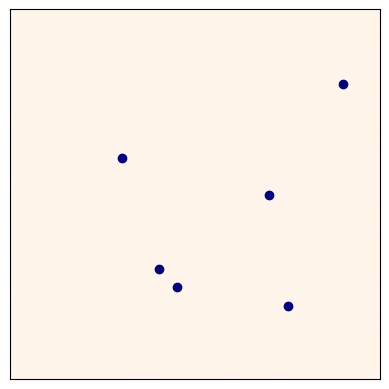

In [5]:
d = 2   # dimension of the data points

# First dataset with 6 points
n = 6
y = torch.zeros((n,d), device=device)
y[0, 0] = 0.9
y[0, 1] = 0.2
y[1, 0] = 0.75
y[1, 1] = 0.8
y[2, 0] = 0.3
y[2, 1] = 0.4
y[3, 0] = 0.4
y[3, 1] = 0.7
y[4, 0] = 0.45
y[4, 1] = 0.75
y[5, 0] = 0.7
y[5, 1] = 0.5

# # Second dataset with 100 points
# n = 100
# t = torch.pi*torch.linspace(-.2,1.2,n)
# y = .05*torch.randn((n,d))
# y[:,0] += torch.cos(t)
# y[:,1] += torch.sin(2*t)
# y = .5 + .3*y
# y = y.to(device)

# Define masses (empirical measure on the data points)
nu = torch.ones(n, device=device)/n

# generate grid for plotting purpose
nr,nc = 256,256
extent = ((-0.5/nc, 1-0.5/nc, 1-0.5/nr, -0.5/nr))
xs = torch.linspace(0, 1, steps=nr)
ys = torch.linspace(0, 1, steps=nc)
xm, ym = torch.meshgrid(xs, ys, indexing='ij')
xm = xm.T
ym = ym.T
xgrid = torch.cat((xm.reshape(nr*nc,1),ym.reshape(nr*nc,1)),1).to(device)

# Plot data points
fig = plt.figure(dpi=100)
plt.xticks([])
plt.yticks([])
plt.imshow(np.zeros((nr,nc)),cmap = 'Oranges', extent=extent) # background
plt.scatter(y[:, 0].cpu(), y[:,1].cpu(),c='navy')
plt.show()

<h3 style="color:#FFA82F;">Define Generator architecture</h3>

QUESTION: Examine the layers and parameters of the following generative network.

Write a short description of the architecture of this network.

**Réponse :** Il s'agit d'un réseau avec nlayer couches : 
- la première dispose de n_in (=10 ici) neurones d'entrée et une fonction d'activation ELU (c'est une sorte de leaky Relu "smooth").
- cette dernière envoie vers les couches cachées toutes identiques avec n_hid (=100) neurones et des fonctions d'activation ELU.
- la couche de sortie est sur n_out (=2 la dimension en 2D) neurone et avec une sigmoide

In [6]:
class Generator(torch.nn.Module):

    def __init__(self, n_in, n_out, n_hid=10, nlayers=3, device=torch.device("cpu")):
        super(Generator, self).__init__()

        self.n_in = n_in
        self.n_out = n_out
        self.n_hid = n_hid
        self.nlayers = nlayers
        self.hidden = nn.ModuleList()

        for n in range(nlayers):
            n_in_t = n_in if n==0 else n_hid
            self.hidden.append(nn.Sequential(
            nn.Linear(n_in_t, n_hid),
            nn.ELU(1)
        ).to(device))

        self.out = nn.Sequential(
            nn.Linear(n_hid, n_out),
            nn.Sigmoid()
        ).to(device)

        self.apply(self._init_weights)


    def forward(self, x):
        for n in range(self.nlayers):
            x = self.hidden[n](x)
        x = self.out(x)
        return x


    def _init_weights(self, module):
        if isinstance(module, nn.Linear):
            torch.nn.init.xavier_uniform_(module.weight, 1.0)
            if module.bias is not None:
                module.bias.data.zero_()


QUESTION: Plot one initial configuration of the generator (draw a batch of generated points)

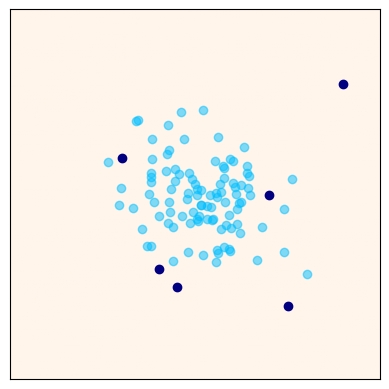

In [7]:
torch.manual_seed(0)  # initialize random seed for reproducibility

n_in = 10    # dimension of the input noise
b = 100      # batch size

# Initialize generator
G = Generator(n_in=n_in, n_out=d, n_hid=100, nlayers=3, device=device)

# Draw a batch x of generated points
#    Input noise z : standard normal with shape (b, n_in)

# Bruit latent
z = torch.randn(b, n_in, device=device)

# Passage dans G pour obtenir les points générés
x = G(z) # batch synthétique


# Plot
xd = x.detach()
fig = plt.figure(dpi=100)
plt.xticks([])
plt.yticks([])
plt.imshow(np.zeros((nr,nc)),cmap = 'Oranges', extent=extent) # background
plt.scatter(xd[:, 0].cpu(), xd[:,1].cpu(),c='deepskyblue',alpha=.5)
plt.scatter(y[:, 0].cpu(), y[:,1].cpu(),c='navy')
plt.show()

<h3 style="color:#FFA82F;">Define Discriminator Architecture</h3>

In [8]:
class Discriminator(nn.Module):
  def __init__(self, n_in, n_hid=10):
    super(Discriminator, self).__init__()

    self.n_hid = n_hid
    self.n_in = n_in

    self.fc1 = nn.Linear(n_in, n_hid)
    self.fc2 = nn.Linear(n_hid, n_hid)
    self.fc3 = nn.Linear(n_hid, 1)

  def forward(self, x):
    y = nn.LeakyReLU(negative_slope=0.2)(self.fc1(x))
    y = nn.LeakyReLU(negative_slope=0.2)(self.fc2(y))
    y = self.fc3(y)
    return y

<h3 style="color:#FFA82F;">Discriminator training with Weight clipping</h3>

QUESTION: For a fixed generator, train the discriminator with WGAN loss and weight clipping.

Try changing the clip_value. What do you observe?

**Réponse** En changeant clip_value, visuellement cela ne semble pas affecter grandement le résultat. Néanmoins on remarque qu'une plus grande valeur de clip_value ralentie la convergence.

[0/1000], 0.020794


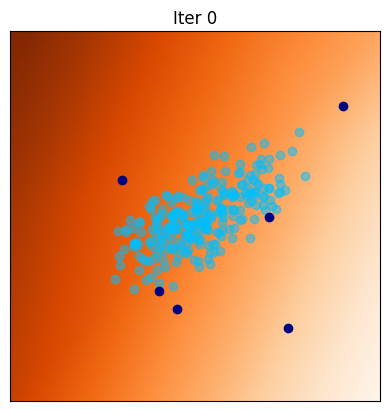

[100/1000], -0.029491


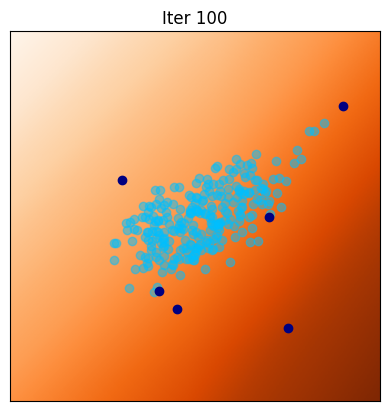

[200/1000], -0.057944


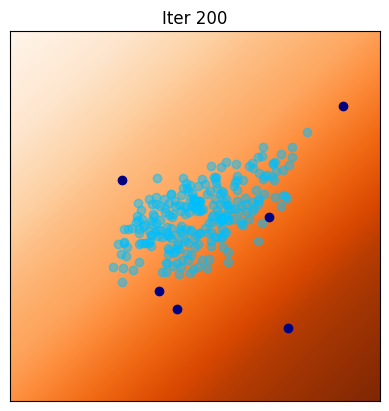

[300/1000], -0.075247


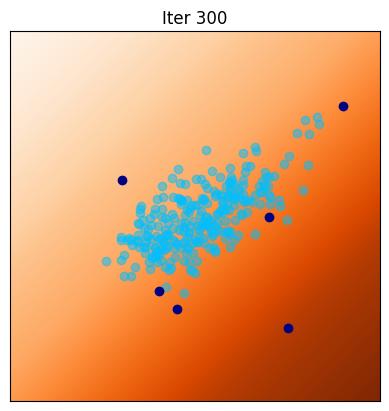

[400/1000], -0.051232


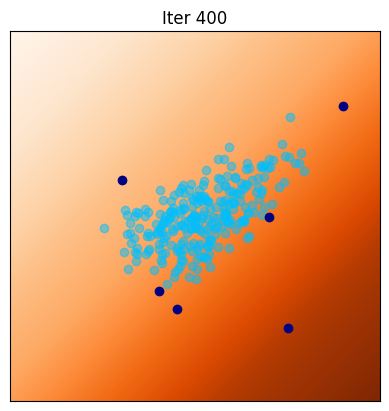

[500/1000], -0.078254


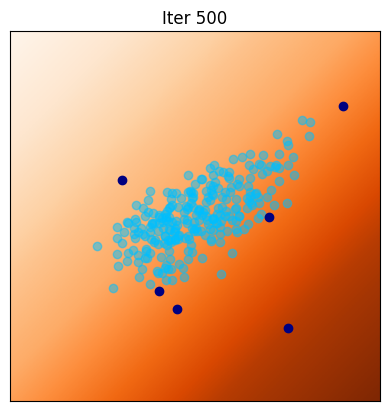

[600/1000], -0.074887


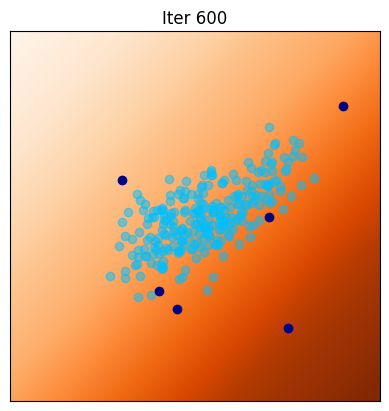

[700/1000], -0.069113


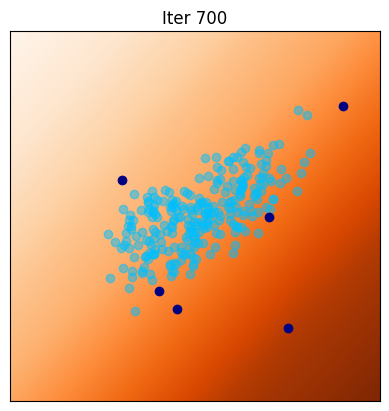

[800/1000], -0.062280


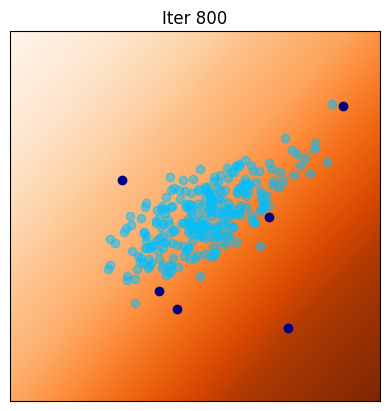

[900/1000], -0.079493


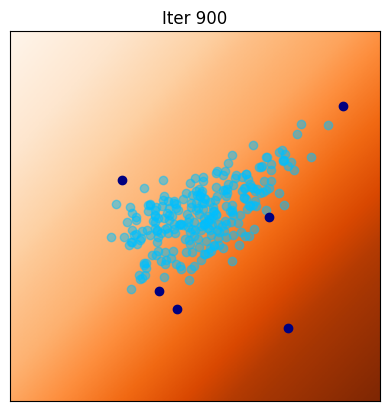

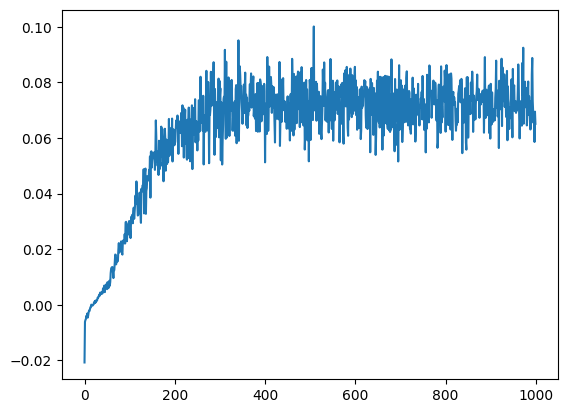

In [ ]:
torch.manual_seed(1)  # initialize random seed for reproducibility

# fix one generator
G = Generator(n_in=n_in, n_out=d, n_hid=10, nlayers=3, device=device)

# parameters for discriminator optimization
lrdisc = 0.002
beta_1 = 0.5
beta_2 = 0.999
niterD=1000

clip_value = .2

D = Discriminator(n_in=d, n_hid=10).to(device)
optimD = optim.Adam(D.parameters(), lr=lrdisc, betas=(beta_1, beta_2))

iter_display = 100  # display current configuration each iter_display iteration

# Lists to keep track of progress
Dlosses = []

for iter in range(0,niterD):

    ### UPDATE OF D ###
    optimD.zero_grad()

       # échantillons réels et fictifs 
    z    = torch.randn(b, n_in, device=device) # bruit latent
    fake = G(z).detach() # points générés (pas de grad G)
    idx  = torch.randint(0, n, (b,), device=device) # indices réels
    real = y[idx] # points cibles

    # passage dans D
    out_real = D(real)
    out_fake = D(fake)

    # loss WGAN : E[D(fake)] - E[D(real)]
    Dloss = out_fake.mean() - out_real.mean()
    Dloss.backward()


    optimD.step()

    for p in D.parameters():
        p.data.clamp_(-clip_value, clip_value)

    ### SAVE LOSS ###
    Dlosst = Dloss.item()
    Dlosses.append(-Dlosst)

    if(iter%iter_display == 0):
        print('[%d/%d], %f' % (iter, niterD, Dlosst))
        Dxgrid = D(xgrid).detach().cpu().numpy().reshape(nr,nc)
        x = G(z)
        xd = x.detach().squeeze(1)
        strtitle = 'Iter '+str(iter)
        fig = plt.figure(dpi=100)
        plt.xticks([])
        plt.yticks([])
        plt.imshow(Dxgrid,cmap = 'Oranges', extent=extent)  # discriminator
        plt.scatter(xd[:, 0].cpu(), xd[:,1].cpu(),c='deepskyblue',alpha=.5)
        plt.scatter(y[:, 0].cpu(), y[:,1].cpu(),c='navy')
        plt.title(strtitle)
        plt.show()

plt.plot(Dlosses)

<h3 style="color:#FFA82F;">Estimate the Lipschitz constant of the discriminator</h3>

The following function computes a lower bound of the Lipschitz constant of $D$ on points that are interpolated between $x$ and $y$.

NB: If $x$ and $y$ do not have the same number of points, we discard the last points.
In comment, we give an alternative code that allows to compute all segments $[x_i, y_j]$ (but it is, of course, slower that just computing segments $[x_i, y_i]$).

In [11]:
def lipconstant(D,x,y):
    b = x.shape[0]
    n = y.shape[0]
    # shrink vectors if they are too large
    if n>b:
        y = y[0:b,:]
        n = b
    else:
        x = x[0:n,:]
        b = n
    # compute interpolated points
    alpha = torch.rand((b,1),device=device)
    interp = alpha * y + (1 - alpha) * x
    interp.requires_grad_()

    # Calculate probability of interpolated examples
    Di = D(interp).view(-1)

    # Calculate gradients of probabilities with respect to examples
    gradout = torch.ones(Di.size()).to(device)
    gradients = torch.autograd.grad(outputs=Di, inputs=interp, grad_outputs=gradout,
       create_graph=True, retain_graph=True)[0]

    # Derivatives of the gradient close to 0 can cause problems because of
    # the square root, so manually calculate norm and add epsilon
    gradients_norm = torch.sqrt(torch.sum(gradients ** 2, dim=1))

    # Return gradient penalty
    return torch.mean(gradients_norm)

#     # Calculate interpolation
#     b = x.shape[0]
#     n = y.shape[0]
#     alpha = torch.rand((b,n,1),device=device)
#     interp = (alpha * y[None,:,:] + (1 - alpha) * x[:,None,:]).flatten(end_dim=1)
#     interp.requires_grad_()


QUESTION: Use this function to examine the Lipschitz constant of the final discriminator obtained above with weight clipping.


In [13]:
### Tirage de deux lots comparables
b_test = 256
z_test   = torch.randn(b_test, n_in, device=device)
x_fake   = G(z_test).detach()                   # faux
idx      = torch.randint(0, n, (b_test,), device=device)
x_real   = y[idx]                               # vrai

### Estimation de la cste de Lipschitz
L_est = lipconstant(D, x_fake, x_real)
print("Lipschitz constant estimate :", L_est.item())

Lipschitz constant estimate : 0.07973171770572662


<h3 style="color:#FFA82F;">Gradient Penalty</h3>

QUESTION: Implement a function computing the gradient penalty of a discriminator $D$ on points $X$ that are randomly interpolated between $x$ and $y$:
$$ GP(D) = \mathbb{E}\left[ \Big(\|\nabla D(X)\| - 1 \Big)^2 \right] .$$
In pratice you will use
$$\|\nabla D(X)\| \approx \sqrt{\|\nabla D (X)\|_2^2 + 10^{-12} } $$
to avoid numerical instability.

In [15]:
def gradient_penalty(D,x,y):
    b = x.shape[0]
    n = y.shape[0]
    # shrink vectors if they are too large
    if n>b:
        y = y[0:b,:]
        n = b
    else:
        x = x[0:n,:]
        b = n
    # compute interpolated points
    alpha = torch.rand((b,1),device=device)
    interp = (alpha * y + (1 - alpha) * x)
    interp.requires_grad_()

#     # Calculate interpolation
#     b = x.shape[0]
#     n = y.shape[0]
#     alpha = torch.rand((b,n,1),device=device)
#     interp = (alpha * y[None,:,:] + (1 - alpha) * x[:,None,:]).flatten(end_dim=1)
#     interp.requires_grad_()

    # Calculate probability of interpolated examples
    Di = D(interp).view(-1)

    # Calculate gradients of probabilities with respect to examples
    gradout = torch.ones(Di.size()).to(device)
    gradients = torch.autograd.grad(outputs=Di, inputs=interp, grad_outputs=gradout,
       create_graph=True, retain_graph=True)[0]

    # Derivatives of the gradient close to 0 can cause problems because of
    # the square root, so manually calculate norm and add epsilon
    gradients_norm = torch.sqrt(torch.sum(gradients ** 2, dim=1) + 1e-12)
    
    # Return gradient penalty
    return ((gradients_norm - 1) ** 2).mean()
#     return ((gradients_norm - 1) ** 2*(gradients_norm>1)).mean()

print(gradient_penalty(D,x,y))

tensor(0.8491, device='mps:0', grad_fn=<MeanBackward0>)


<h3 style="color:#FFA82F;">Discriminator training with Gradient Penalty</h3>

QUESTION: Complete the following code at the blocks ###...###.

Adjust the weight of the gradient penalty (parameter `gpw`) to get a Lipschitz constant $\approx 1$.

[0/1000], Dloss=5.6338, Lip(D)=0.2618


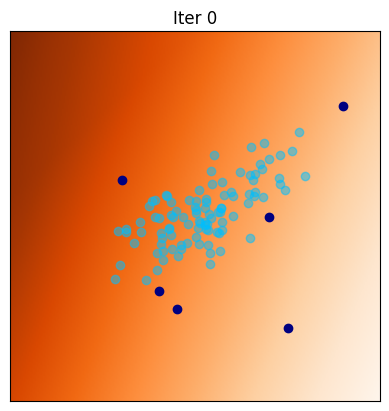

[100/1000], Dloss=0.0829, Lip(D)=0.9880


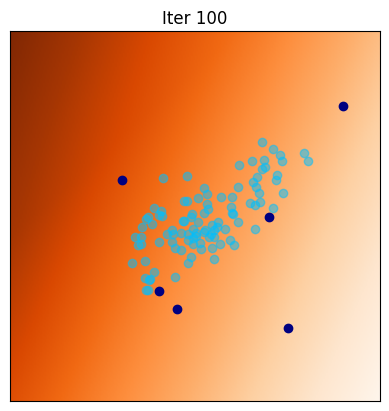

[200/1000], Dloss=0.0714, Lip(D)=0.9953


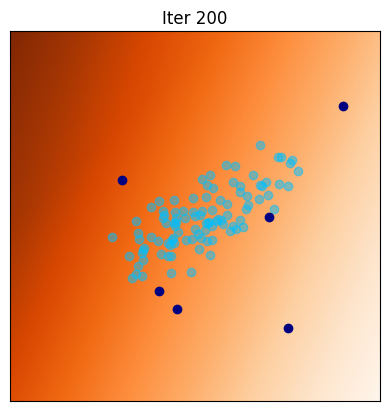

[300/1000], Dloss=0.0902, Lip(D)=0.9962


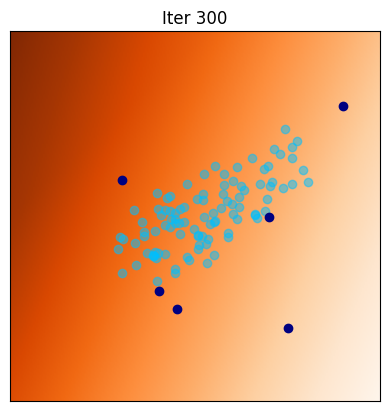

[400/1000], Dloss=0.1275, Lip(D)=0.9969


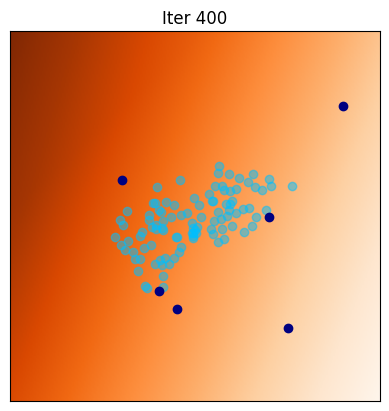

[500/1000], Dloss=0.0557, Lip(D)=0.9983


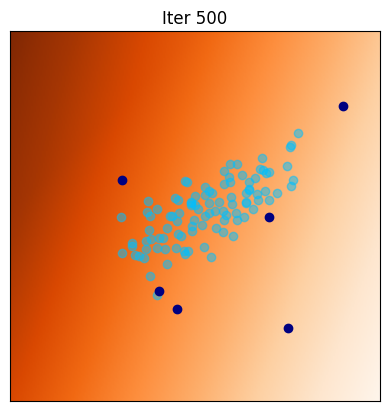

[600/1000], Dloss=0.1001, Lip(D)=0.9932


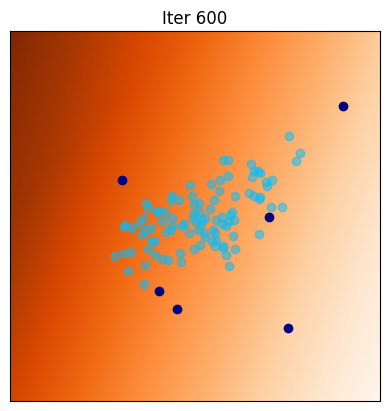

[700/1000], Dloss=0.0815, Lip(D)=0.9970


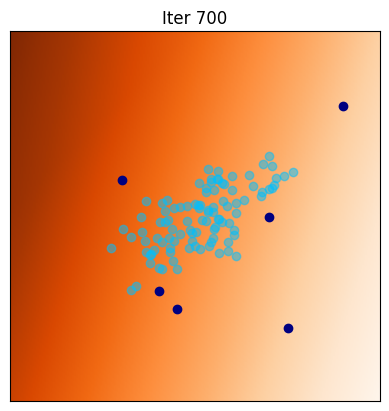

[800/1000], Dloss=0.0745, Lip(D)=0.9967


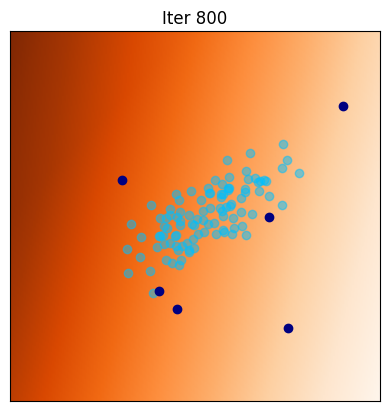

[900/1000], Dloss=0.1285, Lip(D)=0.9951


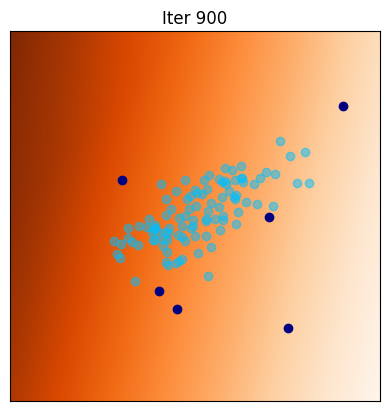

Final estimated Lipschitz constant =  0.9970585703849792


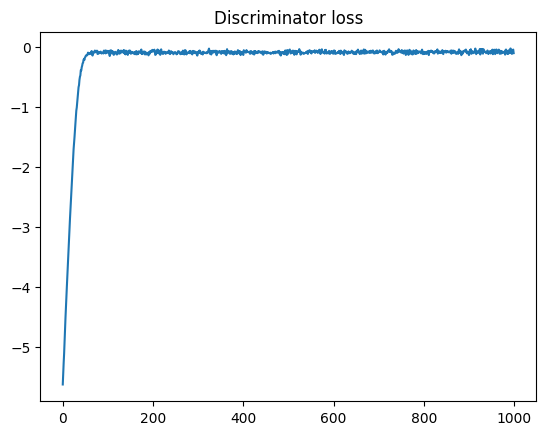

In [16]:
torch.manual_seed(1)  # initialize random seed for reproducibility

# Initialize generators and discriminators
G = Generator(n_in=n_in, n_out=d, n_hid=10, nlayers=3, device=device)
D = Discriminator(n_in=d, n_hid=10).to(device)

# parameters for training
lrdisc = 0.002
beta_1 = 0.5
beta_2 = 0.999
niterD=1000
gpw = 10       # parameter for gradient penalty

optimD = optim.Adam(D.parameters(), lr=lrdisc, betas=(beta_1, beta_2))


iter_display = 100  # display current configuration each iter_display iteration

# Lists to keep track of progress
Dlosses = []

for iter in range(0,niterD):

    ### UPDATE OF D ###
    optimD.zero_grad()

    # échantillons réel / faux
    z    = torch.randn(b, n_in, device=device)
    fake = G(z)                               # batch généré
    idx  = torch.randint(0, n, (b,), device=device)
    real = y[idx]                             # batch réel

    # sorties du discriminateur
    out_real = D(real).view(-1)
    out_fake = D(fake).view(-1)

    # gradient penalty
    gp = gradient_penalty(D, fake.detach(), real)

    # loss WGAN-GP
    Dloss = out_fake.mean() - out_real.mean() + gpw * gp
    Dloss.backward()
    optimD.step()

    ### SAVE LOSS ###
    Dlosst = Dloss.item()
    Dlosses.append(-Dlosst)

    if(iter%iter_display == 0):
        print('[%d/%d], Dloss=%.4f, Lip(D)=%.4f' % (iter, niterD, Dlosst,lipconstant(D,x,y).item()))
        Dxgrid = D(xgrid).detach().cpu().numpy().reshape(nr,nc)
        x = G(z)
        xd = x.detach().squeeze(1)
        strtitle = 'Iter '+str(iter)
        fig = plt.figure(dpi=100)
        plt.xticks([])
        plt.yticks([])
        plt.imshow(Dxgrid,cmap = 'Oranges', extent=extent)  # discriminator
        plt.scatter(xd[:, 0].cpu(), xd[:,1].cpu(),c='deepskyblue',alpha=.5)
        plt.scatter(y[:, 0].cpu(), y[:,1].cpu(),c='navy')
        plt.title(strtitle)
        plt.show()

print('Final estimated Lipschitz constant = ',lipconstant(D,x,y).item())

plt.figure(dpi=100)
plt.plot(Dlosses)
plt.title('Discriminator loss')
plt.show()

<h3 style="color:#FFA82F;">WGAN-GP training</h3>

QUESTION: Complete the following code in order to train simultaneously the generator and discriminator.

You will alternate `niterD` iterations on the discriminator and `niterG` iterations of the discriminator.

[1/100] 	Loss_D: -0.2745	Loss_G: 0.8056	Lip(D)=1.9015
[2/100] 	Loss_D: -0.2075	Loss_G: 0.7281	Lip(D)=1.6661
[3/100] 	Loss_D: -0.1139	Loss_G: 0.6523	Lip(D)=1.3870
[4/100] 	Loss_D: -0.0953	Loss_G: 0.8763	Lip(D)=1.5186
[5/100] 	Loss_D: -0.0941	Loss_G: 0.7307	Lip(D)=1.4012


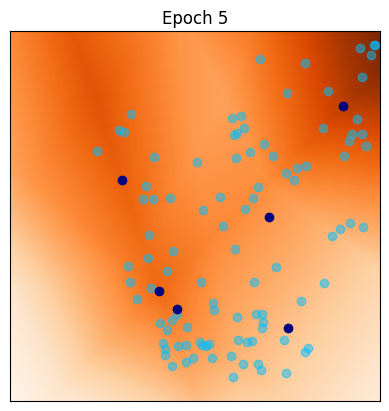

[6/100] 	Loss_D: -0.1293	Loss_G: 0.1001	Lip(D)=1.4236
[7/100] 	Loss_D: -0.1400	Loss_G: 0.8773	Lip(D)=1.1939
[8/100] 	Loss_D: -0.1100	Loss_G: 0.8117	Lip(D)=1.2580
[9/100] 	Loss_D: -0.0783	Loss_G: 0.3608	Lip(D)=1.1651
[10/100] 	Loss_D: -0.0977	Loss_G: -0.0790	Lip(D)=1.6558


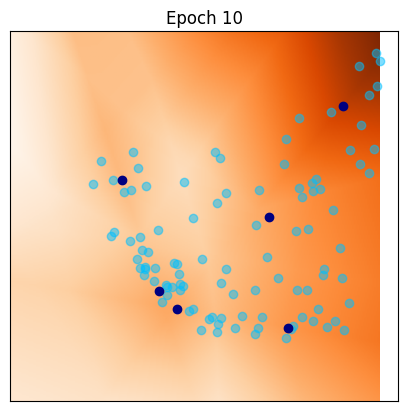

[11/100] 	Loss_D: -0.0574	Loss_G: 0.5601	Lip(D)=1.2018
[12/100] 	Loss_D: -0.1537	Loss_G: 1.1375	Lip(D)=1.4028
[13/100] 	Loss_D: -0.1475	Loss_G: 1.1440	Lip(D)=1.4966
[14/100] 	Loss_D: -0.0963	Loss_G: 0.7950	Lip(D)=1.1044
[15/100] 	Loss_D: -0.1466	Loss_G: 1.0069	Lip(D)=1.2473


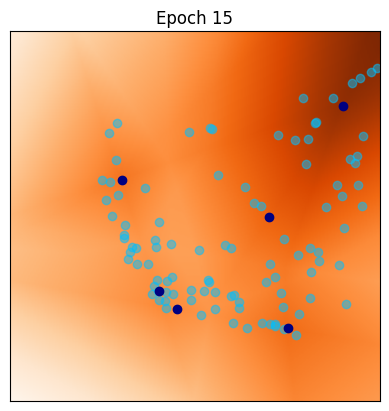

[16/100] 	Loss_D: -0.1243	Loss_G: 0.9638	Lip(D)=1.1027
[17/100] 	Loss_D: -0.1162	Loss_G: 1.2050	Lip(D)=1.1481
[18/100] 	Loss_D: -0.1075	Loss_G: 1.2978	Lip(D)=1.2286
[19/100] 	Loss_D: -0.1113	Loss_G: 1.2301	Lip(D)=1.3931
[20/100] 	Loss_D: -0.0736	Loss_G: 1.3247	Lip(D)=1.2313


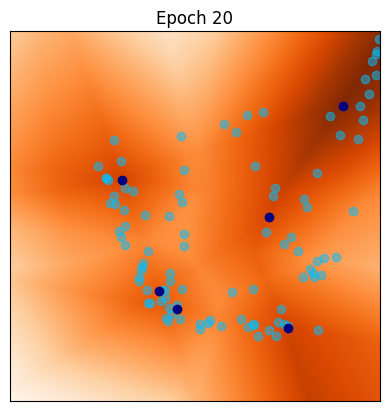

[21/100] 	Loss_D: -0.1059	Loss_G: 1.4391	Lip(D)=1.3744
[22/100] 	Loss_D: -0.1055	Loss_G: 1.4865	Lip(D)=1.4640
[23/100] 	Loss_D: -0.1046	Loss_G: 1.4537	Lip(D)=1.4573
[24/100] 	Loss_D: -0.1102	Loss_G: 1.4525	Lip(D)=1.3548
[25/100] 	Loss_D: -0.1228	Loss_G: 1.3992	Lip(D)=1.5608


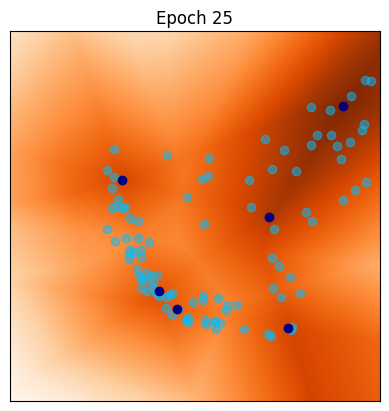

[26/100] 	Loss_D: -0.1010	Loss_G: 1.4831	Lip(D)=1.2593
[27/100] 	Loss_D: -0.1127	Loss_G: 1.5830	Lip(D)=1.5197
[28/100] 	Loss_D: -0.0816	Loss_G: 1.4842	Lip(D)=1.3679
[29/100] 	Loss_D: -0.1180	Loss_G: 1.4142	Lip(D)=1.2987
[30/100] 	Loss_D: -0.0968	Loss_G: 1.4970	Lip(D)=1.3484


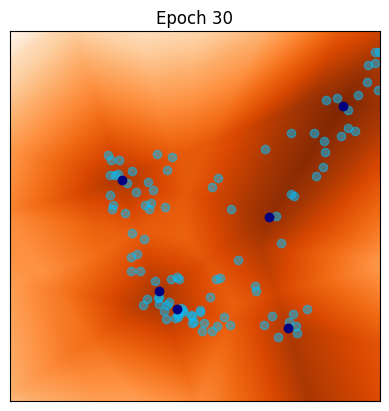

[31/100] 	Loss_D: -0.1182	Loss_G: 1.6889	Lip(D)=1.4134
[32/100] 	Loss_D: -0.0967	Loss_G: 1.5772	Lip(D)=1.4540
[33/100] 	Loss_D: -0.1163	Loss_G: 1.4594	Lip(D)=1.4549
[34/100] 	Loss_D: -0.0922	Loss_G: 1.6340	Lip(D)=1.4129
[35/100] 	Loss_D: -0.1044	Loss_G: 1.5893	Lip(D)=1.3092


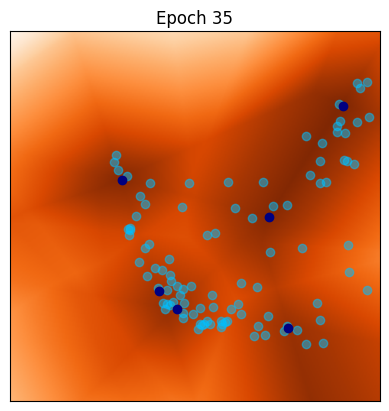

[36/100] 	Loss_D: -0.0922	Loss_G: 1.5947	Lip(D)=1.3564
[37/100] 	Loss_D: -0.0948	Loss_G: 1.5769	Lip(D)=1.4574
[38/100] 	Loss_D: -0.0897	Loss_G: 1.5295	Lip(D)=1.4031
[39/100] 	Loss_D: -0.1064	Loss_G: 1.5136	Lip(D)=1.2586
[40/100] 	Loss_D: -0.0761	Loss_G: 1.5365	Lip(D)=1.2216


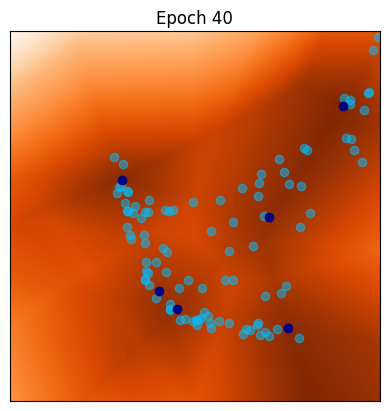

[41/100] 	Loss_D: -0.0759	Loss_G: 1.5594	Lip(D)=1.4302
[42/100] 	Loss_D: -0.0714	Loss_G: 1.4956	Lip(D)=1.2977
[43/100] 	Loss_D: -0.0820	Loss_G: 1.5742	Lip(D)=1.4031
[44/100] 	Loss_D: -0.0765	Loss_G: 1.4567	Lip(D)=1.1649
[45/100] 	Loss_D: -0.0943	Loss_G: 1.5277	Lip(D)=1.4338


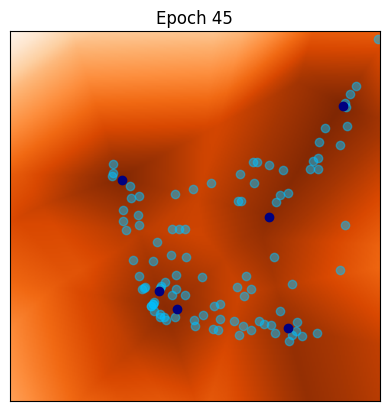

[46/100] 	Loss_D: -0.0784	Loss_G: 1.6361	Lip(D)=1.4286
[47/100] 	Loss_D: -0.0949	Loss_G: 1.5565	Lip(D)=1.3504
[48/100] 	Loss_D: -0.0734	Loss_G: 1.4306	Lip(D)=1.3667
[49/100] 	Loss_D: -0.0984	Loss_G: 1.5097	Lip(D)=1.3273
[50/100] 	Loss_D: -0.0639	Loss_G: 1.5103	Lip(D)=1.2158


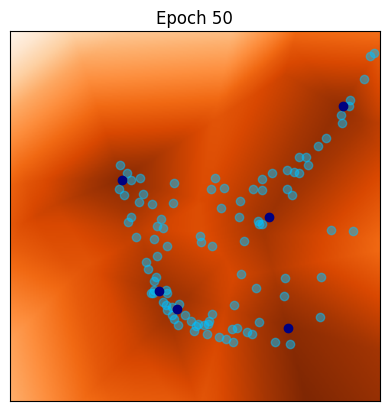

[51/100] 	Loss_D: -0.0955	Loss_G: 1.4264	Lip(D)=1.2334
[52/100] 	Loss_D: -0.0878	Loss_G: 1.5191	Lip(D)=1.4303
[53/100] 	Loss_D: -0.0722	Loss_G: 1.4830	Lip(D)=1.5541
[54/100] 	Loss_D: -0.0790	Loss_G: 1.4408	Lip(D)=1.2813
[55/100] 	Loss_D: -0.0835	Loss_G: 1.4175	Lip(D)=1.3483


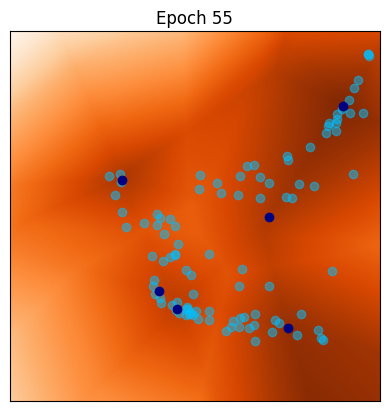

[56/100] 	Loss_D: -0.1038	Loss_G: 1.5382	Lip(D)=1.2301
[57/100] 	Loss_D: -0.0855	Loss_G: 1.5460	Lip(D)=1.3469
[58/100] 	Loss_D: -0.1136	Loss_G: 1.5671	Lip(D)=1.3869
[59/100] 	Loss_D: -0.0798	Loss_G: 1.5248	Lip(D)=1.2677
[60/100] 	Loss_D: -0.1166	Loss_G: 1.6575	Lip(D)=1.3440


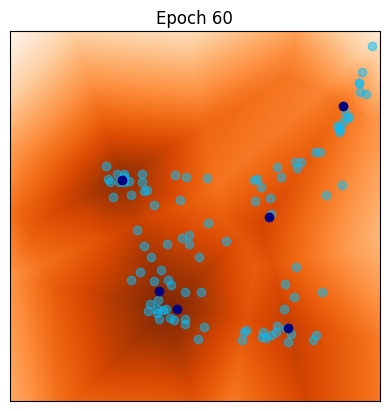

[61/100] 	Loss_D: -0.0832	Loss_G: 1.6010	Lip(D)=1.3212
[62/100] 	Loss_D: -0.1060	Loss_G: 1.5420	Lip(D)=1.2049
[63/100] 	Loss_D: -0.0649	Loss_G: 1.5617	Lip(D)=1.4265
[64/100] 	Loss_D: -0.0535	Loss_G: 1.4991	Lip(D)=1.3585
[65/100] 	Loss_D: -0.0878	Loss_G: 1.5349	Lip(D)=1.3867


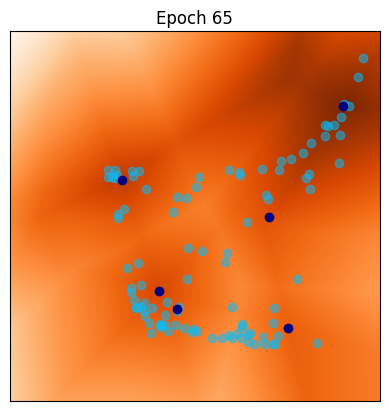

[66/100] 	Loss_D: -0.0723	Loss_G: 1.6098	Lip(D)=1.2186
[67/100] 	Loss_D: -0.0858	Loss_G: 1.3815	Lip(D)=1.3544
[68/100] 	Loss_D: -0.0786	Loss_G: 1.5125	Lip(D)=1.1547
[69/100] 	Loss_D: -0.0722	Loss_G: 1.4511	Lip(D)=1.2763
[70/100] 	Loss_D: -0.1153	Loss_G: 1.3743	Lip(D)=1.4372


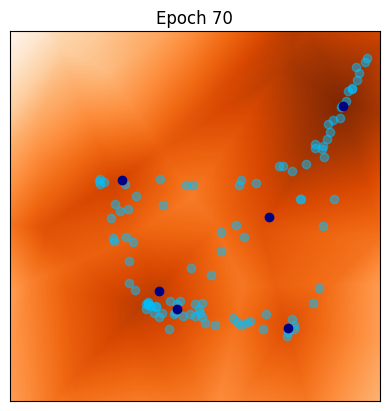

[71/100] 	Loss_D: -0.0890	Loss_G: 1.5716	Lip(D)=1.2141
[72/100] 	Loss_D: -0.0791	Loss_G: 1.4272	Lip(D)=1.2547
[73/100] 	Loss_D: -0.1201	Loss_G: 1.3376	Lip(D)=1.4410
[74/100] 	Loss_D: -0.0720	Loss_G: 1.3615	Lip(D)=1.4024
[75/100] 	Loss_D: -0.0906	Loss_G: 1.2297	Lip(D)=1.3976


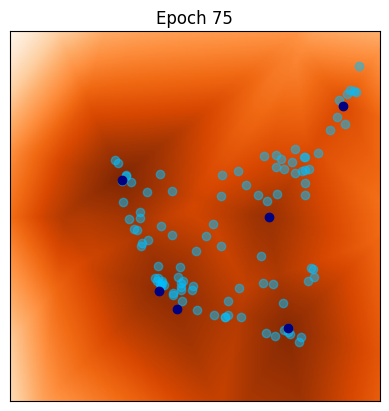

[76/100] 	Loss_D: -0.0721	Loss_G: 1.0750	Lip(D)=1.4870
[77/100] 	Loss_D: -0.1221	Loss_G: 1.0236	Lip(D)=1.4397
[78/100] 	Loss_D: -0.0952	Loss_G: 1.1790	Lip(D)=1.2087
[79/100] 	Loss_D: -0.0892	Loss_G: 1.2566	Lip(D)=1.5647
[80/100] 	Loss_D: -0.0927	Loss_G: 1.1726	Lip(D)=1.2976


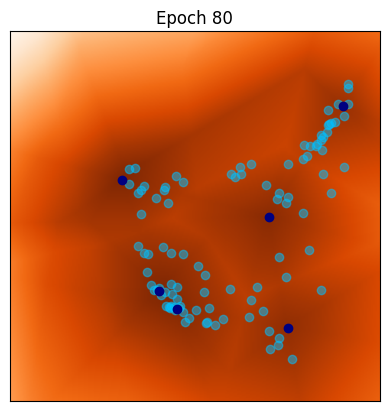

[81/100] 	Loss_D: -0.0984	Loss_G: 1.0846	Lip(D)=1.2697
[82/100] 	Loss_D: -0.0542	Loss_G: 0.9359	Lip(D)=1.6138
[83/100] 	Loss_D: -0.1012	Loss_G: 1.2284	Lip(D)=1.3914
[84/100] 	Loss_D: -0.0705	Loss_G: 1.2534	Lip(D)=1.4591
[85/100] 	Loss_D: -0.0879	Loss_G: 1.1336	Lip(D)=1.2950


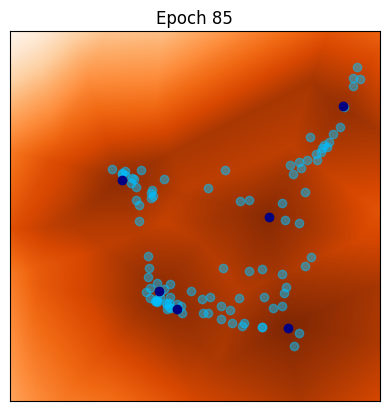

[86/100] 	Loss_D: -0.0838	Loss_G: 1.1496	Lip(D)=1.3642
[87/100] 	Loss_D: -0.0680	Loss_G: 1.0623	Lip(D)=1.2023
[88/100] 	Loss_D: -0.0753	Loss_G: 1.0133	Lip(D)=1.3375
[89/100] 	Loss_D: -0.1147	Loss_G: 1.3189	Lip(D)=1.1819
[90/100] 	Loss_D: -0.0919	Loss_G: 1.1795	Lip(D)=1.3146


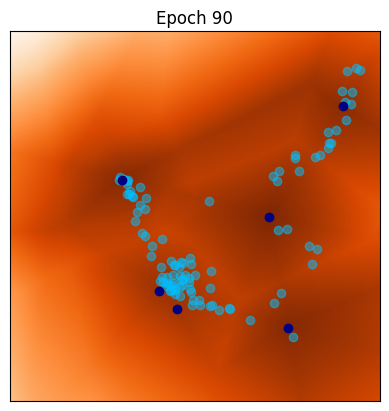

[91/100] 	Loss_D: -0.0976	Loss_G: 1.0311	Lip(D)=1.1616
[92/100] 	Loss_D: -0.0803	Loss_G: 1.0948	Lip(D)=1.0671
[93/100] 	Loss_D: -0.0945	Loss_G: 1.1745	Lip(D)=1.2114
[94/100] 	Loss_D: -0.0979	Loss_G: 1.0619	Lip(D)=1.6507
[95/100] 	Loss_D: -0.0953	Loss_G: 1.1749	Lip(D)=1.0934


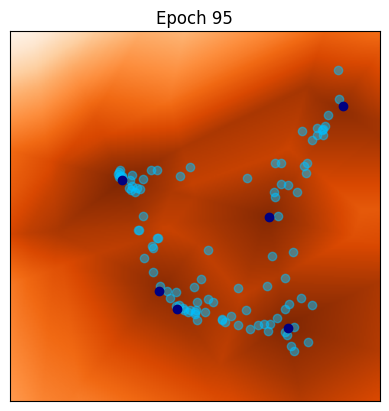

[96/100] 	Loss_D: -0.0781	Loss_G: 1.1006	Lip(D)=1.4032
[97/100] 	Loss_D: -0.0896	Loss_G: 1.1189	Lip(D)=1.3620
[98/100] 	Loss_D: -0.0673	Loss_G: 1.2329	Lip(D)=1.3359
[99/100] 	Loss_D: -0.0722	Loss_G: 1.1751	Lip(D)=1.4445


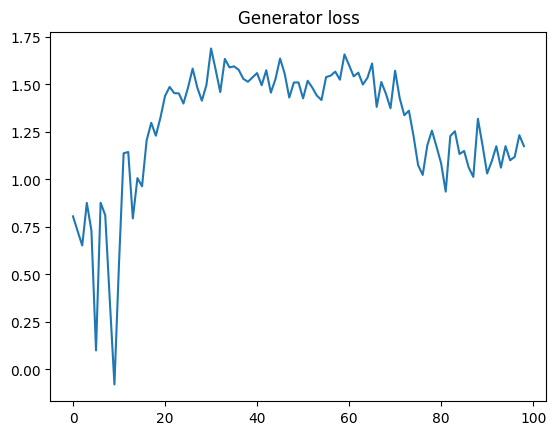

<All keys matched successfully>

In [17]:
## parameters for training
n_epochs = 100
niterD=1000
niterG=10
gpw = .1

lr = 0.002      # learning rate for generator
lrdisc = 0.002  # learning rate for discriminator
beta_1 = 0.5
beta_2 = 0.999

torch.manual_seed(1)  # initialize random seed for reproducibility

# Initialize generators and discriminators
G = Generator(n_in=n_in, n_out=d, n_hid=10, nlayers=3, device=device)
optimG = optim.Adam(G.parameters(), lr=lr)

D = Discriminator(n_in=d, n_hid=10).to(device)
optimD = optim.Adam(D.parameters(), lr=lrdisc, betas=(beta_1, beta_2))


Glosses = []
Dlosses = []

iter_display = 5

# Main loop
for epoch in range(1,n_epochs):

    ############################
    ### Train discriminator (niterD iterations)
    ############################
    for iter in range(0, niterD):
        optimD.zero_grad()

        # échantillons réel & faux
        z    = torch.randn(b, n_in, device=device)
        fake = G(z).detach() # on coupe le graph côté G
        idx  = torch.randint(0, n, (b,), device=device)
        real = y[idx]

        # sorties du discriminateur
        out_real = D(real).view(-1)
        out_fake = D(fake).view(-1)

        # pénalité de gradient
        gp = gradient_penalty(D, fake, real)

        # perte WGAN-GP
        Dloss = out_fake.mean() - out_real.mean() + gpw * gp
        Dloss.backward()
        optimD.step()


    ############################
    ### Train generator (niterG iterations)
    ############################
    for iter in range(0, niterG):
        optimG.zero_grad()

        z = torch.randn(b, n_in, device=device)
        gen = G(z)
        Gloss = -D(gen).view(-1).mean() # maximise D(gen)
        Gloss.backward()
        optimG.step()

        x = gen.detach() # pour suivi Lip(D)


    # Output training stats
    print('[%d/%d] \tLoss_D: %.4f\tLoss_G: %.4f\tLip(D)=%.4f'
      % (epoch, n_epochs, Dloss.item(), Gloss.item(),lipconstant(D,x,y).item()))
    Glosses.append(Gloss.item())
    Dlosses.append(Dloss.item())

    if(epoch % iter_display == 0):
        Dxgrid = D(xgrid).detach().cpu().numpy().reshape(nr,nc)
        z = torch.randn(b, n_in, device=device)
        x = G(z)
        xd = x.detach().squeeze(1)
        strtitle = 'Epoch '+str(epoch)
        fig = plt.figure(dpi=100)
        plt.xticks([])
        plt.yticks([])
        plt.imshow(Dxgrid,cmap = 'Oranges', extent=extent)
        plt.scatter(xd[:, 0].cpu(), xd[:,1].cpu(),c='deepskyblue',alpha=.5)
        plt.scatter(y[:, 0].cpu(), y[:,1].cpu(),c='navy')
        plt.title(strtitle)
        plt.show()


plt.figure(dpi=100)
plt.plot(Glosses)
plt.title('Generator loss')
plt.show()

# Save final generator for later use
wgan = Generator(n_in=n_in, n_out=d, n_hid=10, nlayers=3, device=device)
wgan.load_state_dict(G.state_dict())

<h3 style="color:#FFA82F;">Sensitivy to hyper-parameters</h3>

QUESTION: Repeat the WGAN learning experiment, by changing the parameters of the optimization (learning rates, number of updates of D and G, etc).

From your experiments, can you draw a few recommendations for stable training?

In [32]:
param_grid = [
    (0.001,0.002,10,1,0.1),
    (0.002,0.002,5,1,0.1),
    (0.002,0.003,10,1,0.05),
    (0.0005,0.002,15,1,0.2),
]

results = []
for cfg_id,(lrG,lrD,nd,ng,gpw) in enumerate(param_grid):
    G = Generator(n_in=n_in, n_out=d, n_hid=10, nlayers=3, device=device)
    D = Discriminator(n_in=d, n_hid=10).to(device)

    optimG = optim.Adam(G.parameters(), lr=lrG, betas=(0.5,0.9))
    optimD = optim.Adam(D.parameters(), lr=lrD, betas=(0.5,0.9))

    # un mini-entraînement express (3 epochs) pour comparer vite
    for epoch in range(3):
        # D
        for _ in range(nd):
            z    = torch.randn(b, n_in, device=device)
            fake = G(z).detach()
            idx  = torch.randint(0, n, (b,), device=device)
            real = y[idx]
            optimD.zero_grad()
            out_real = D(real).view(-1)
            out_fake = D(fake).view(-1)
            gp = gradient_penalty(D, fake, real)
            Dloss = out_fake.mean() - out_real.mean() + gpw*gp
            Dloss.backward()
            optimD.step()
        # G
        for _ in range(ng):
            z = torch.randn(b, n_in, device=device)
            optimG.zero_grad()
            Gloss = -D(G(z)).view(-1).mean()
            Gloss.backward()
            optimG.step()

    # métriques rapides
    L = lipconstant(D, G(torch.randn(b, n_in, device=device)).detach(), y).item()
    results.append((cfg_id, Dloss.item(), Gloss.item(), L))
    print(f"Cfg {cfg_id}: lrG={lrG}, lrD={lrD}, nd={nd}, ng={ng}, gpw={gpw} | "
          f"Dloss={Dloss.item():.3f} G={Gloss.item():.3f} Lip={L:.2f}")

print("\nRésumé :")
for r in results:
    print(f"Cfg {r[0]} => Dloss={r[1]:.3f}, Gloss={r[2]:.3f}, Lip={r[3]:.2f}")


Cfg 0: lrG=0.001, lrD=0.002, nd=10, ng=1, gpw=0.1 | Dloss=0.073 G=-0.057 Lip=0.18
Cfg 1: lrG=0.002, lrD=0.002, nd=5, ng=1, gpw=0.1 | Dloss=0.067 G=-0.045 Lip=0.19
Cfg 2: lrG=0.002, lrD=0.003, nd=10, ng=1, gpw=0.05 | Dloss=-0.086 G=-0.255 Lip=0.72
Cfg 3: lrG=0.0005, lrD=0.002, nd=15, ng=1, gpw=0.2 | Dloss=0.129 G=0.237 Lip=0.24

Résumé :
Cfg 0 => Dloss=0.073, Gloss=-0.057, Lip=0.18
Cfg 1 => Dloss=0.067, Gloss=-0.045, Lip=0.19
Cfg 2 => Dloss=-0.086, Gloss=-0.255, Lip=0.72
Cfg 3 => Dloss=0.129, Gloss=0.237, Lip=0.24


<h3 style="color:#FFA82F;">Train the generator only</h3>

QUESTION: For a fixed discriminator, optimize only the generator only. Can you explain what is happening then?

**Réponse** Tous les points semblent se regrouper en haut a gauche. Car le discriminateur etant fixé, le générateur apprend a faire converger ses points vers les zones non détectées par le discriminateur (coin de l'image).

[0/3000] Gloss = 0.2348


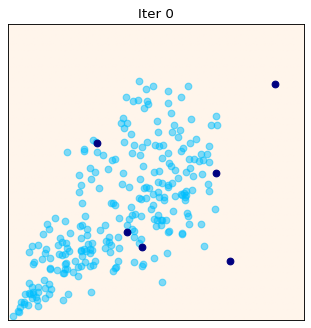

[500/3000] Gloss = 0.0577


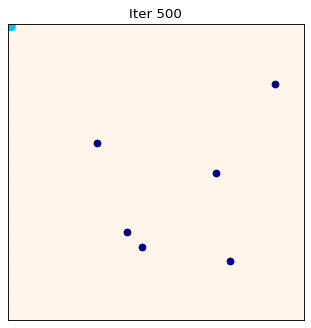

[1000/3000] Gloss = 0.0574


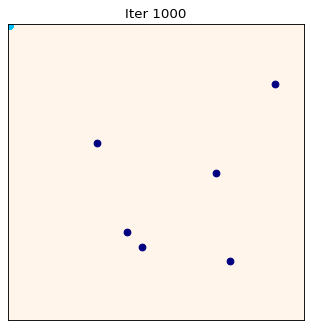

[1500/3000] Gloss = 0.0574


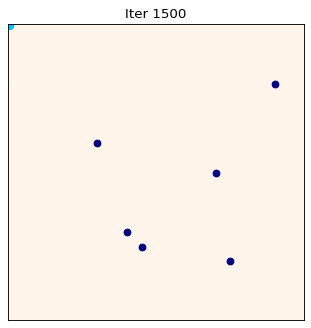

[2000/3000] Gloss = 0.0574


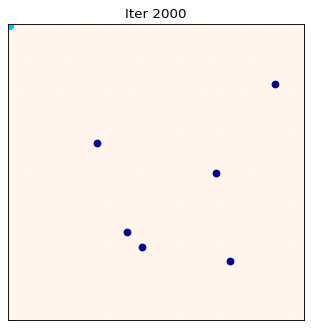

[2500/3000] Gloss = 0.0573


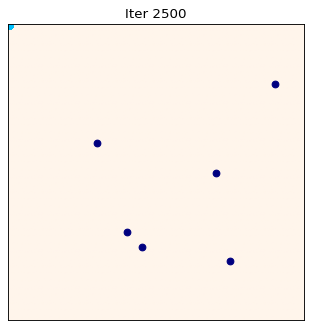

In [33]:
# Discriminator déjà entraîné (D) – on le fige
for p in D.parameters():
    p.requires_grad_(False)

# Optimiseur pour G
optimG_only = optim.Adam(G.parameters(), lr=1e-3)

niterG_only = 3000
b = 256

for it in range(niterG_only):
    optimG_only.zero_grad()

    z      = torch.randn(b, n_in, device=device)
    x_fake = G(z)
    Gloss  = -D(x_fake).view(-1).mean()
    Gloss.backward()
    optimG_only.step()

    if it % 500 == 0:
        print(f"[{it}/{niterG_only}] Gloss = {Gloss.item():.4f}")
        # visualisation rapide
        with torch.no_grad():
            x_vis = G(torch.randn(b, n_in, device=device)).cpu()
        plt.figure(dpi=80)
        plt.xticks([]); plt.yticks([])
        plt.imshow(np.zeros((nr,nc)),cmap='Oranges',extent=extent)
        plt.scatter(x_vis[:,0], x_vis[:,1], c='deepskyblue', alpha=.5)
        plt.scatter(y[:,0].cpu(), y[:,1].cpu(), c='navy')
        plt.title(f'Iter {it}')
        plt.show()


<h1 style="color:#007F5C;">BONUS Exercise (to do at home) : Learn a standard GAN</h1>

<h3 style="color:#FFA82F;">Define Loss for GAN training</h3>

For stable GAN training uses the Binary cross-entropy loss which takes labeled data as input.

The data points $y$ should correspond to values $\approx 1$, whereas fake points $x$ should get values $\approx 0$.

We also introduce the sigmoid function. for displaying purpose: for GAN training, the discriminator values in $[0,1]$ will be obtained by applying after $D$.

In [ ]:
criterion = nn.BCEWithLogitsLoss()
V1 = torch.full((n,1), 1. , dtype=torch.float, device=device)
V0 = torch.full((b,1), 0. , dtype=torch.float, device=device)

sig = nn.Sigmoid()

<h3 style="color:#FFA82F;">Train the discriminator for a fixed generator</h3>

In [28]:
import torch.nn as nn
criterion = nn.BCEWithLogitsLoss()
sig = nn.Sigmoid()

[0/3000], 1.507175


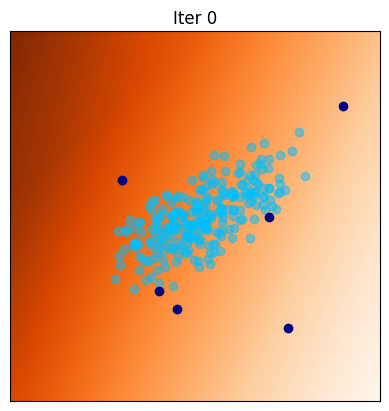

[100/3000], 1.355511


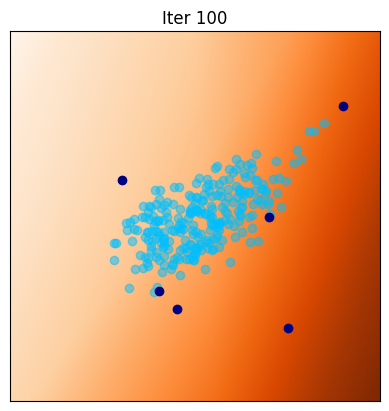

[200/3000], 1.247558


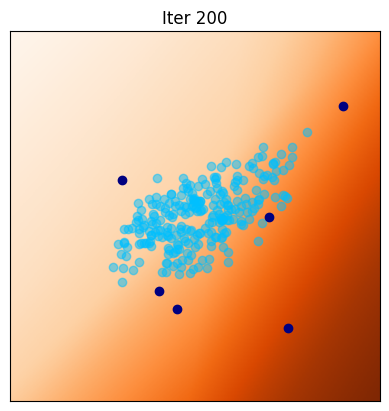

[300/3000], 1.046412


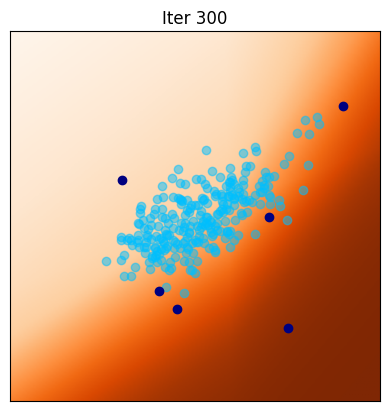

[400/3000], 1.066283


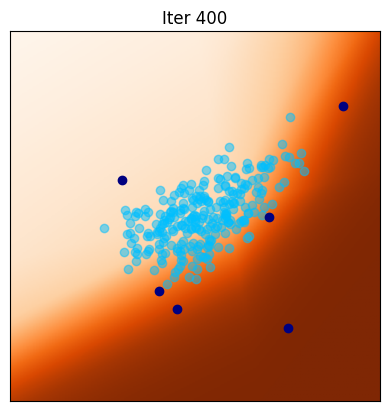

[500/3000], 0.831603


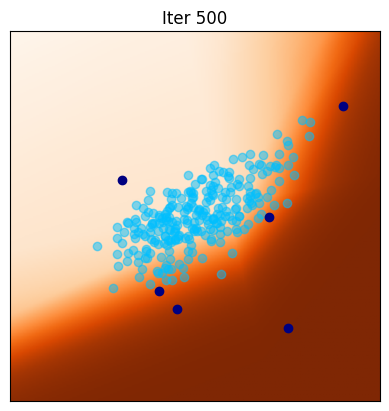

[600/3000], 0.703761


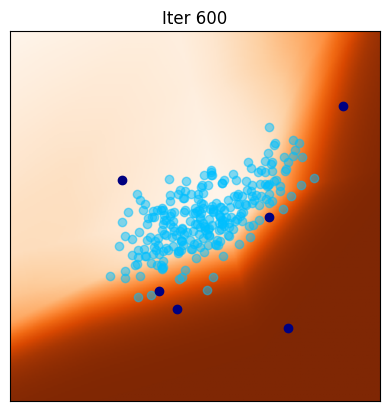

[700/3000], 0.611562


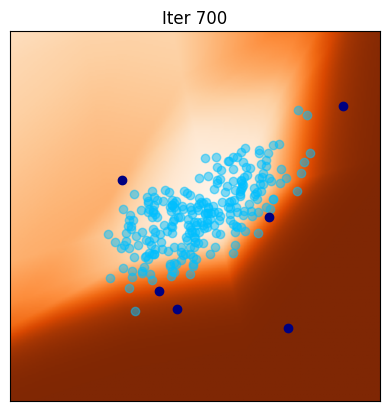

[800/3000], 0.442872


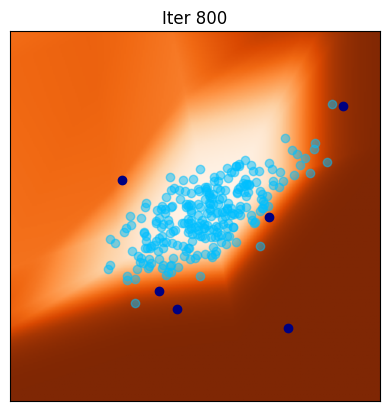

[900/3000], 0.319893


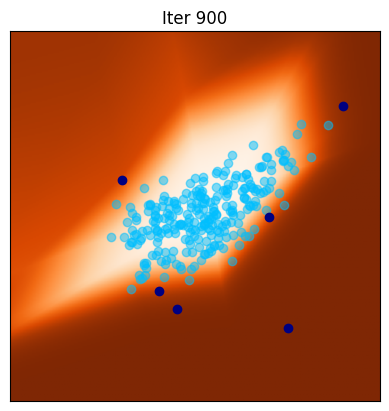

[1000/3000], 0.273048


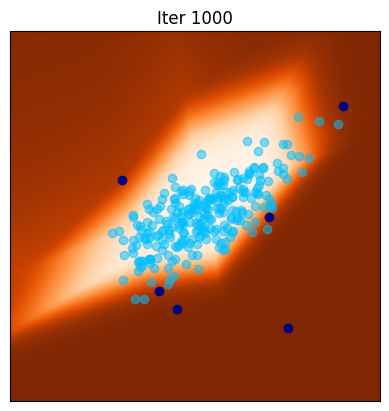

[1100/3000], 0.231875


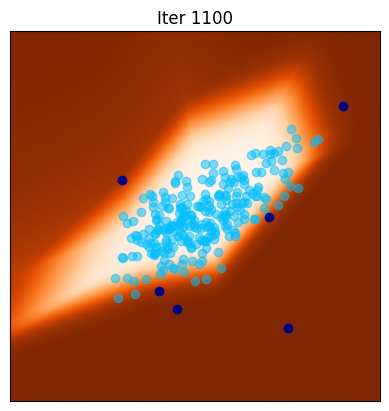

[1200/3000], 0.213715


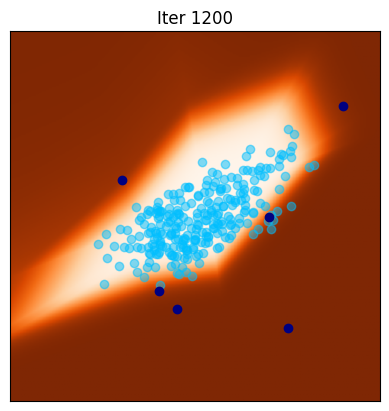

[1300/3000], 0.169903


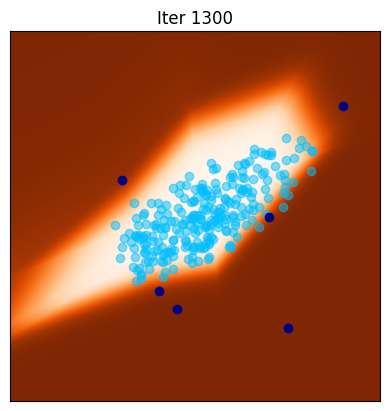

[1400/3000], 0.184187


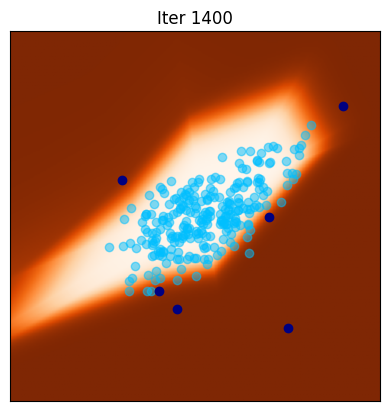

[1500/3000], 0.140501


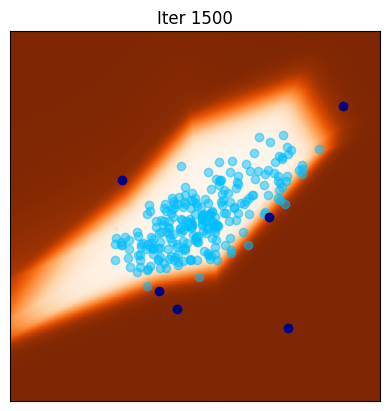

[1600/3000], 0.161926


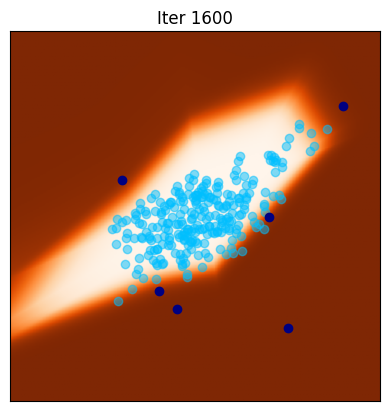

[1700/3000], 0.199839


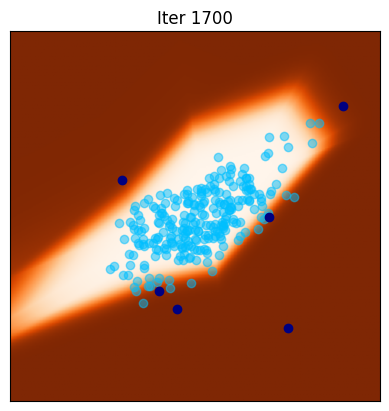

[1800/3000], 0.145198


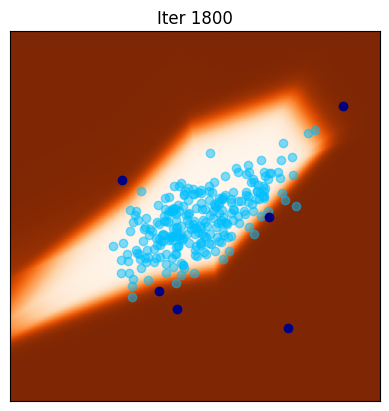

[1900/3000], 0.170807


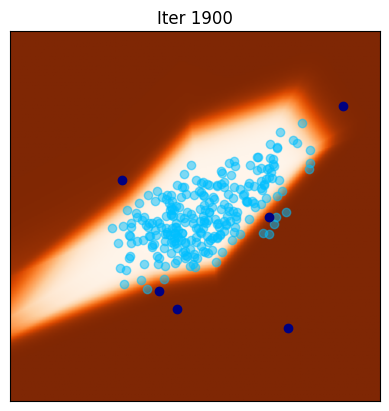

[2000/3000], 0.159100


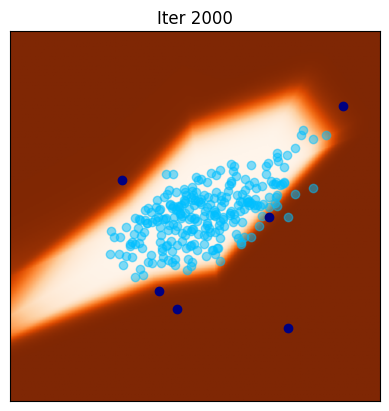

[2100/3000], 0.133734


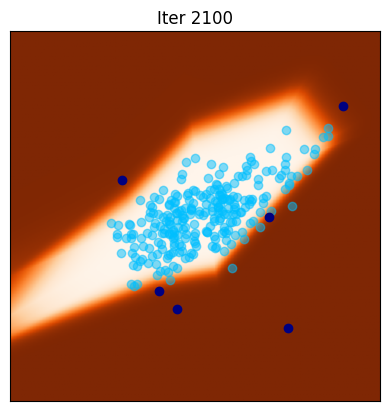

[2200/3000], 0.107951


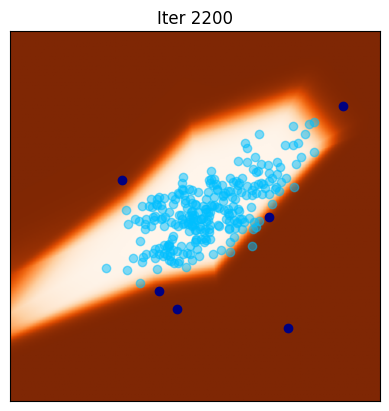

[2300/3000], 0.145036


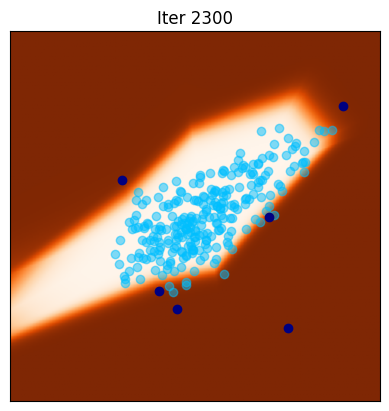

[2400/3000], 0.215924


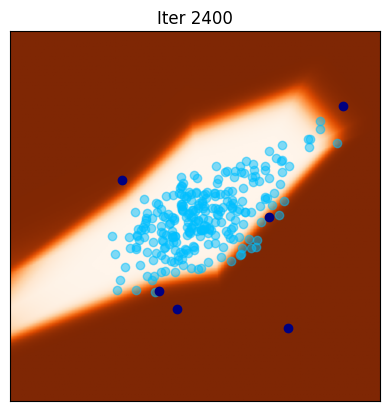

[2500/3000], 0.114981


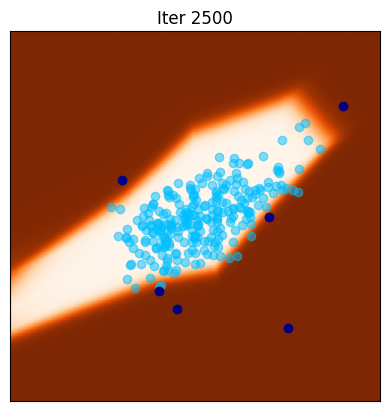

[2600/3000], 0.134894


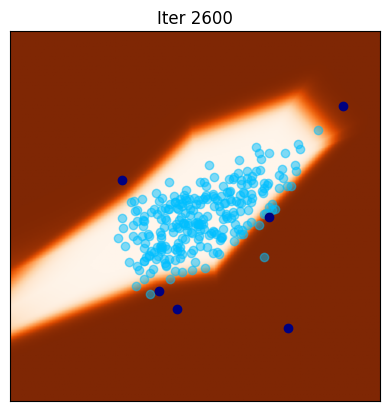

[2700/3000], 0.178916


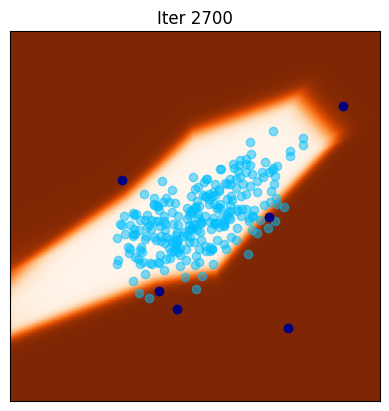

[2800/3000], 0.093594


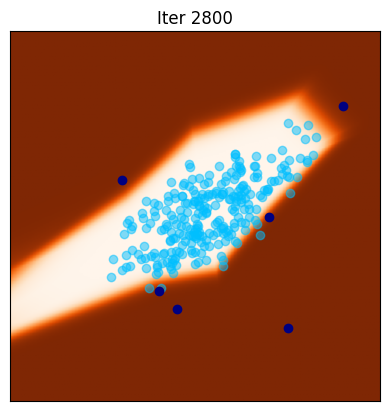

[2900/3000], 0.077482


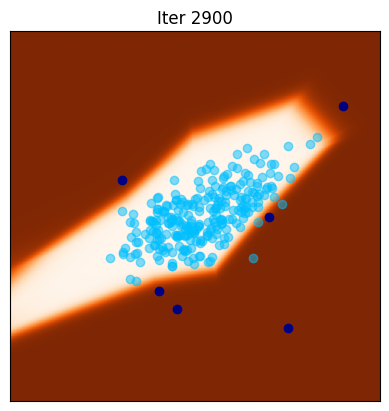

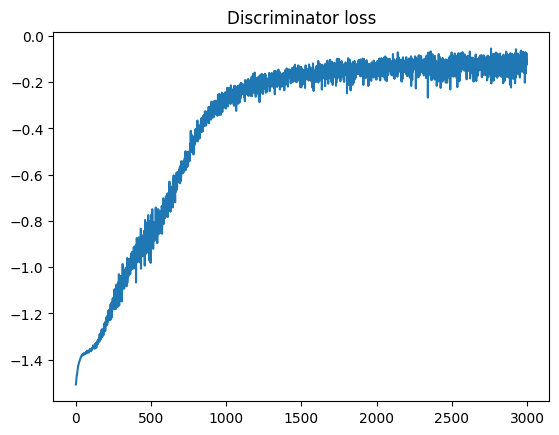

In [30]:
torch.manual_seed(1)  # initialize random seed for reproducibility

# parameters for discriminator optimization
lrdisc = 0.002
beta_1 = 0.5
beta_2 = 0.999
niterD=3000

# Initialize generators and discriminators
G = Generator(n_in=n_in, n_out=d, n_hid=10, nlayers=3, device=device)
optimG = optim.Adam(G.parameters(), lr=lr)

D = Discriminator(n_in=d, n_hid=10).to(device)
optimD = optim.Adam(D.parameters(), lr=lrdisc, betas=(beta_1, 0.999))

iter_display = 100  # display current configuration each iter_display iteration

Dlosses = []

for iter in range(0,niterD):

    ### UPDATE OF D ###
    optimD.zero_grad()

    # batch réel / faux
    z    = torch.randn(b, n_in, device=device)
    fake = G(z).detach()                                   # pas de grad côté G
    idx  = torch.randint(0, n, (b,), device=device)
    real = y[idx]

    # sorties du discriminateur
    out_real = D(real)
    out_fake = D(fake)

    loss_real = criterion(out_real, torch.ones_like(out_real))
    loss_fake = criterion(out_fake, torch.zeros_like(out_fake))
    Dloss = loss_real + loss_fake
    Dloss.backward()
    optimD.step()

    ### SAVE LOSS ###
    Dlosst = Dloss.item()
    Dlosses.append(-Dlosst)

    if(iter%iter_display == 0):
        print('[%d/%d], %f' % (iter, niterD, Dlosst))
        Dxgrid = sig(D(xgrid)).detach().cpu().numpy().reshape(nr,nc)
        x = G(z)
        xd = x.detach().squeeze(1)
        strtitle = 'Iter '+str(iter)
        fig = plt.figure(dpi=100)
        plt.xticks([])
        plt.yticks([])
        plt.imshow(Dxgrid,cmap = 'Oranges', extent=extent)  # discriminator
        plt.scatter(xd[:, 0].cpu(), xd[:,1].cpu(),c='deepskyblue',alpha=.5)
        plt.scatter(y[:, 0].cpu(), y[:,1].cpu(),c='navy')
        plt.title(strtitle)
        plt.show()


### Plot the evolution of the discriminator loss ###
plt.figure(dpi=100)
plt.plot(Dlosses)
plt.title('Discriminator loss')
plt.show()

## Train both the Generator and Discriminator

[0/100] 	Loss_D: 1.3600	Loss_G: 0.6875


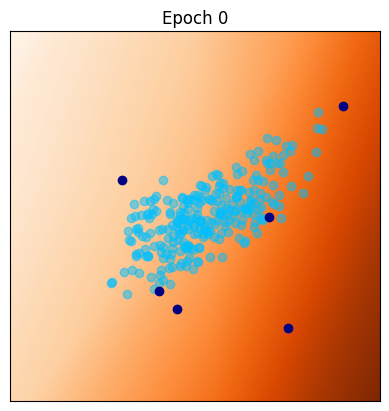

[1/100] 	Loss_D: 1.2650	Loss_G: 0.7409
[2/100] 	Loss_D: 1.0888	Loss_G: 0.9133
[3/100] 	Loss_D: 1.0353	Loss_G: 1.0878
[4/100] 	Loss_D: 0.9611	Loss_G: 1.1991
[5/100] 	Loss_D: 0.8605	Loss_G: 1.2770
[6/100] 	Loss_D: 0.8199	Loss_G: 1.4710
[7/100] 	Loss_D: 0.7445	Loss_G: 1.6617
[8/100] 	Loss_D: 0.6906	Loss_G: 1.8225
[9/100] 	Loss_D: 0.6243	Loss_G: 1.8606
[10/100] 	Loss_D: 0.6724	Loss_G: 1.9679


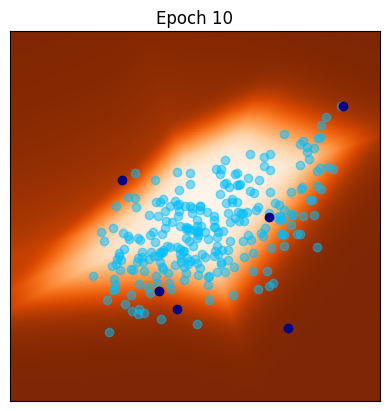

[11/100] 	Loss_D: 0.7872	Loss_G: 1.8923
[12/100] 	Loss_D: 0.8034	Loss_G: 1.6308
[13/100] 	Loss_D: 0.8586	Loss_G: 2.0985
[14/100] 	Loss_D: 0.8397	Loss_G: 1.6890
[15/100] 	Loss_D: 0.8384	Loss_G: 1.6108
[16/100] 	Loss_D: 0.9745	Loss_G: 1.4899
[17/100] 	Loss_D: 0.8919	Loss_G: 1.3933
[18/100] 	Loss_D: 0.9811	Loss_G: 1.2860
[19/100] 	Loss_D: 0.9935	Loss_G: 1.3326
[20/100] 	Loss_D: 0.9388	Loss_G: 1.4464


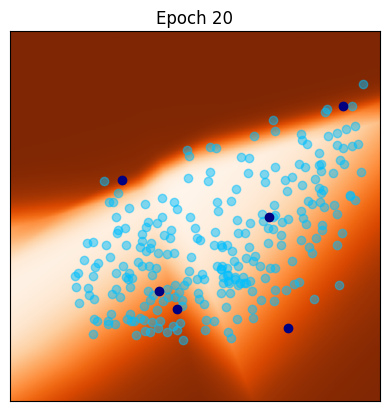

[21/100] 	Loss_D: 0.9811	Loss_G: 1.2623
[22/100] 	Loss_D: 1.0090	Loss_G: 1.1726
[23/100] 	Loss_D: 0.9714	Loss_G: 1.2721
[24/100] 	Loss_D: 1.0283	Loss_G: 1.2193
[25/100] 	Loss_D: 0.9963	Loss_G: 1.1856
[26/100] 	Loss_D: 0.9625	Loss_G: 1.2737
[27/100] 	Loss_D: 1.1578	Loss_G: 1.1721
[28/100] 	Loss_D: 1.0873	Loss_G: 1.1879
[29/100] 	Loss_D: 1.0862	Loss_G: 1.2607
[30/100] 	Loss_D: 1.1397	Loss_G: 1.0229


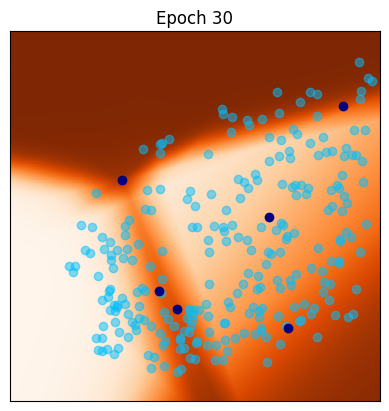

[31/100] 	Loss_D: 1.1091	Loss_G: 1.2412
[32/100] 	Loss_D: 1.0877	Loss_G: 1.2349
[33/100] 	Loss_D: 1.1065	Loss_G: 1.1531
[34/100] 	Loss_D: 1.1938	Loss_G: 1.2532
[35/100] 	Loss_D: 1.1229	Loss_G: 1.1513
[36/100] 	Loss_D: 1.2079	Loss_G: 0.9554
[37/100] 	Loss_D: 1.1598	Loss_G: 0.9299
[38/100] 	Loss_D: 1.2089	Loss_G: 1.0198
[39/100] 	Loss_D: 1.1267	Loss_G: 1.0131
[40/100] 	Loss_D: 1.0974	Loss_G: 0.9797


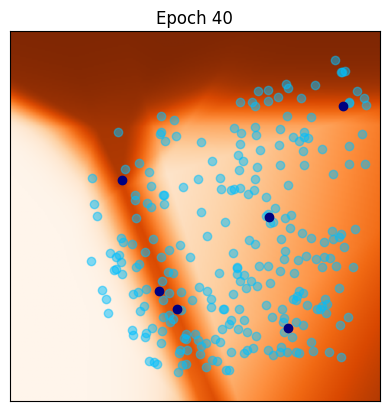

[41/100] 	Loss_D: 1.2215	Loss_G: 0.9818
[42/100] 	Loss_D: 1.1692	Loss_G: 1.0170
[43/100] 	Loss_D: 1.1298	Loss_G: 0.9661
[44/100] 	Loss_D: 1.1844	Loss_G: 0.8745
[45/100] 	Loss_D: 1.1045	Loss_G: 0.9528
[46/100] 	Loss_D: 1.0606	Loss_G: 1.0325
[47/100] 	Loss_D: 1.0766	Loss_G: 0.9904
[48/100] 	Loss_D: 1.0514	Loss_G: 1.0474
[49/100] 	Loss_D: 1.0753	Loss_G: 1.0360
[50/100] 	Loss_D: 1.0547	Loss_G: 1.2099


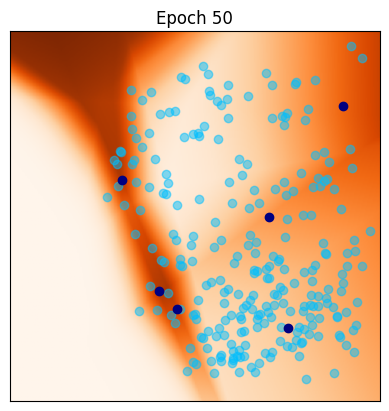

[51/100] 	Loss_D: 0.9853	Loss_G: 1.1329
[52/100] 	Loss_D: 1.0260	Loss_G: 1.1509
[53/100] 	Loss_D: 0.9939	Loss_G: 1.1303
[54/100] 	Loss_D: 0.9226	Loss_G: 1.1722
[55/100] 	Loss_D: 0.9442	Loss_G: 1.1896
[56/100] 	Loss_D: 0.9241	Loss_G: 1.2829
[57/100] 	Loss_D: 0.9655	Loss_G: 1.2744
[58/100] 	Loss_D: 0.9340	Loss_G: 1.3820
[59/100] 	Loss_D: 0.9913	Loss_G: 1.2825
[60/100] 	Loss_D: 0.9047	Loss_G: 1.3663


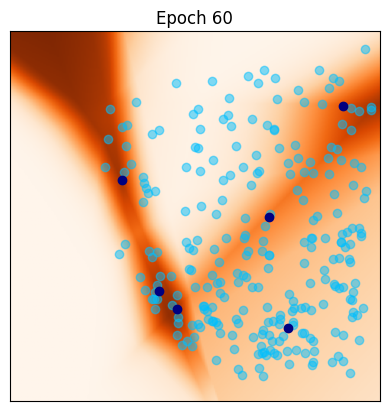

[61/100] 	Loss_D: 0.8500	Loss_G: 1.4768
[62/100] 	Loss_D: 0.9031	Loss_G: 1.2411
[63/100] 	Loss_D: 0.8679	Loss_G: 1.6060
[64/100] 	Loss_D: 0.9070	Loss_G: 1.2900
[65/100] 	Loss_D: 0.9564	Loss_G: 1.2349
[66/100] 	Loss_D: 0.9788	Loss_G: 1.3771
[67/100] 	Loss_D: 0.8932	Loss_G: 1.3157
[68/100] 	Loss_D: 0.9259	Loss_G: 1.3983
[69/100] 	Loss_D: 0.9313	Loss_G: 1.2879
[70/100] 	Loss_D: 0.8541	Loss_G: 1.3336


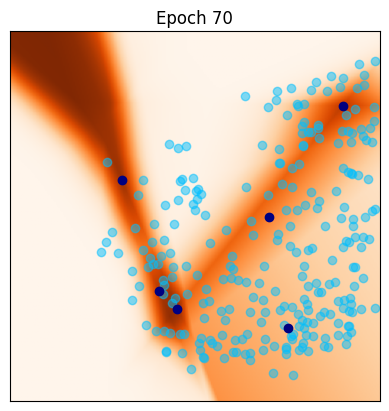

[71/100] 	Loss_D: 0.9076	Loss_G: 1.4220
[72/100] 	Loss_D: 0.8681	Loss_G: 1.4045
[73/100] 	Loss_D: 0.8205	Loss_G: 1.4267
[74/100] 	Loss_D: 0.9133	Loss_G: 1.4149
[75/100] 	Loss_D: 0.9289	Loss_G: 1.3634
[76/100] 	Loss_D: 0.8981	Loss_G: 1.2427
[77/100] 	Loss_D: 0.8835	Loss_G: 1.3049
[78/100] 	Loss_D: 0.8511	Loss_G: 1.4077
[79/100] 	Loss_D: 0.8302	Loss_G: 1.2941
[80/100] 	Loss_D: 0.8586	Loss_G: 1.3409


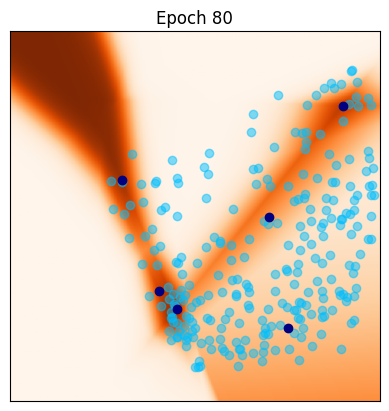

[81/100] 	Loss_D: 0.8983	Loss_G: 1.3463
[82/100] 	Loss_D: 0.8569	Loss_G: 1.1770
[83/100] 	Loss_D: 0.8165	Loss_G: 1.4367
[84/100] 	Loss_D: 0.7808	Loss_G: 1.3959
[85/100] 	Loss_D: 0.8628	Loss_G: 1.2974
[86/100] 	Loss_D: 0.8525	Loss_G: 1.6306
[87/100] 	Loss_D: 0.7999	Loss_G: 1.1701
[88/100] 	Loss_D: 0.8722	Loss_G: 1.3784
[89/100] 	Loss_D: 0.8067	Loss_G: 1.6008
[90/100] 	Loss_D: 0.8211	Loss_G: 1.3559


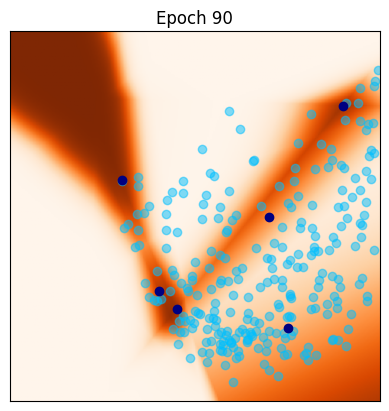

[91/100] 	Loss_D: 0.8256	Loss_G: 1.3080
[92/100] 	Loss_D: 0.7886	Loss_G: 1.3500
[93/100] 	Loss_D: 0.8630	Loss_G: 1.4808
[94/100] 	Loss_D: 0.8008	Loss_G: 1.5333
[95/100] 	Loss_D: 0.8667	Loss_G: 1.5519
[96/100] 	Loss_D: 0.8506	Loss_G: 1.2109
[97/100] 	Loss_D: 0.9010	Loss_G: 1.2574
[98/100] 	Loss_D: 0.8954	Loss_G: 1.3739
[99/100] 	Loss_D: 0.8314	Loss_G: 1.7299


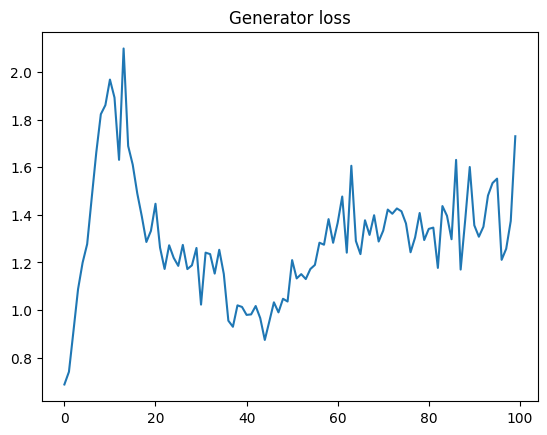

In [ ]:
lr = 0.002
lrdisc = 0.002

# paramètres d’entraînement
n_epochs = 100
niterD = 100
niterG = 1

torch.manual_seed(1)

# initialise G et D
G = Generator(n_in=n_in, n_out=d, n_hid=10, nlayers=3, device=device)
optimG = optim.Adam(G.parameters(), lr=lr)

D = Discriminator(n_in=d, n_hid=10).to(device)
optimD = optim.Adam(D.parameters(), lr=lrdisc, betas=(beta_1, beta_2))

Glosses, Dlosses = [], []
iter_display = 10
b = 256   # batch size

for epoch in range(n_epochs):

    ############################
    # Train discriminator
    ############################
    for _ in range(niterD):
        optimD.zero_grad()

        z    = torch.randn(b, n_in, device=device)
        fake = G(z).detach()
        idx  = torch.randint(0, n, (b,), device=device)
        real = y[idx]

        out_real = D(real)
        out_fake = D(fake)

        loss_real = criterion(out_real, torch.ones_like(out_real))
        loss_fake = criterion(out_fake, torch.zeros_like(out_fake))
        Dloss = loss_real + loss_fake
        Dloss.backward()
        optimD.step()

    ############################
    # Train generator
    ############################
    for _ in range(niterG):
        optimG.zero_grad()

        z = torch.randn(b, n_in, device=device)
        gen = G(z)
        Gloss = criterion(D(gen), torch.ones_like(D(gen))) # veut tromper D
        Gloss.backward()
        optimG.step()

    # stats
    print('[%d/%d] \tLoss_D: %.4f\tLoss_G: %.4f'
          % (epoch, n_epochs, Dloss.item(), Gloss.item()))
    Glosses.append(Gloss.item())
    Dlosses.append(-Dloss.item())

    if epoch % iter_display == 0:
        Dxgrid = sig(D(xgrid)).detach().cpu().numpy().reshape(nr, nc)
        z_vis = torch.randn(b, n_in, device=device)
        x_vis = G(z_vis).detach()
        fig = plt.figure(dpi=100)
        plt.xticks([]); plt.yticks([])
        plt.imshow(Dxgrid, cmap='Oranges', extent=extent)
        plt.scatter(x_vis[:, 0].cpu(), x_vis[:, 1].cpu(), c='deepskyblue', alpha=.5)
        plt.scatter(y[:, 0].cpu(), y[:, 1].cpu(), c='navy')
        plt.title(f'Epoch {epoch}')
        plt.show()

# sauvegarde finale
gan = Generator(n_in=n_in, n_out=d, n_hid=10, nlayers=3, device=device)
gan.load_state_dict(G.state_dict())

# courbe de perte du générateur
plt.figure(dpi=100)
plt.plot(Glosses)
plt.title('Generator loss')
plt.show()